# Load Functions

## 0. imports

In [2]:
from reportlab.lib.styles import ParagraphStyle, getSampleStyleSheet
from reportlab.lib.pagesizes import A4
from reportlab.lib import colors
from reportlab.platypus import SimpleDocTemplate, Paragraph, Spacer, Table, TableStyle, Image
from reportlab.lib.utils import ImageReader
import os
import mne
import json

from utils import *
from eeg_qc import compute_eeg_pipeline, test_eeg_pipeline
from ecg_qc import ecg_qc 
from eda_qc import eda_qc
from rsp_qc import *
from mic_qc import *
from lsl_problem import *
from et_qc import *
from webcam_qc import *
import matplotlib

In [6]:
subject = "P5943825"
xdf_filename = f'/Users/bryan.gonzalez/CUNY_subs/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'

#subject = "P5526515"
# xdf_filename = f'/Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'
#xdf_filename = f'/Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_facial_run-001_mobi.xdf'

#xdf_filename = #Apurva's xdf file

video_filename = '/'.join(xdf_filename.split('/')[:-1])+ f'/sub-{subject}_task-CUNY_run-001_video.avi'


In [7]:
stim_df = import_stim_data(xdf_filename)

trigger recovery


100%|██████████| 11885/11885 [00:00<00:00, 146523.80it/s]


      value   length   start_time     end_time
2     False   855540     0.200003    19.600285
236   False   207270   143.002244   147.702295
246   False   211680   149.402345   154.202398
262   False  1666980   161.302532   199.103102
264   False   277830   199.203126   205.503203
266   False   568890   205.703228   218.603408
826   False   149940   380.305969   383.706000
834   False  1821330   386.506066   427.806692
840   False   136710   430.206752   433.306778
842   False   308700   433.506804   440.506891
1148  False  2178540   577.609065   627.009818
1152  False   251370   627.409847   633.109914
1404  False  2112390   729.311446   777.212176
1814  False  1314180   929.314585   959.115030
1816  False   520380   959.415058   971.215220
2252  False   864360  1132.817779  1152.418064
2254  False  1585390  1152.518089  1188.468517
Audio Segment 1: Duration = 0.20 seconds
Audio Segment 2: Duration = 123.40 seconds
Audio Segment 3: Duration = 1.70 seconds
Audio Segment 4: Duration = 7

In [7]:
log = []

# Get Metrics

## 1. EEG

In [8]:
#Compute the eeg vars
eeg_vars, raw_cleaned, ica, eeg_df = compute_eeg_pipeline(xdf_filename, 
                                                          stim_df=stim_df, 
                                                          task='RestingState')


Creating RawArray with float64 data, n_channels=128, n_times=299988
    Range : 0 ... 299987 =      0.000 ...   299.998 secs
Ready.
Creating RawArray with float64 data, n_channels=1, n_times=299988
    Range : 0 ... 299987 =      0.000 ...   299.998 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.7s finished


Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.6s finished


Removed notch frequencies (Hz):
     60.00 : 7482 windows
    120.00 : 7482 windows
    180.00 : 7482 windows
    239.00 : 7482 windows
    240.00 : 7482 windows
    241.00 : 7482 windows
    299.00 : 7482 windows
    300.00 : 7482 windows
    301.00 : 7482 windows
    359.00 : 7482 windows
    360.00 : 7482 windows
    361.00 : 7482 windows
    419.00 : 7482 windows
    420.00 : 7482 windows
    421.00 : 7482 windows
    479.00 : 7482 windows
    480.00 : 7482 windows
    481.00 : 7482 windows
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.4s


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.6s finished


Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 21
Total # of chunks: 6
Current chunk:
1
2
3
4
5
6

RANSAC done!


2025-07-01 14:17:06,331 - pyprep.reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': ['Cz'], 'bad_by_deviation': ['E56', 'E63'], 'bad_by_hf_noise': ['E39', 'E80', 'E106'], 'bad_by_correlation': ['E56', 'E63', 'E69'], 'bad_by_SNR': [], 'bad_by_dropout': [], 'bad_by_ransac': [np.str_('E106'), np.str_('E126')], 'bad_all': ['E56', np.str_('E126'), 'E69', 'E39', 'Cz', 'E63', 'E80', 'E106']}


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 31
Total # of chunks: 4
Current chunk:
1
2
3
4

RANSAC done!


2025-07-01 14:18:24,732 - pyprep.reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': ['Cz'], 'bad_by_deviation': ['E8', 'E63', 'E56'], 'bad_by_hf_noise': ['E39'], 'bad_by_correlation': ['E63', 'E39', 'E56', 'E69'], 'bad_by_SNR': ['E39'], 'bad_by_dropout': [], 'bad_by_ransac': [np.str_('E126')], 'bad_all': ['E56', np.str_('E126'), 'E69', 'E39', 'Cz', 'E8', 'E63']}


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 94.0 mm
Computing interpolation matrix from 122 sensor positions
Interpolating 7 sensors


2025-07-01 14:18:25,131 - pyprep.reference - INFO - Iterations: 1


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 41
Total # of chunks: 3
Current chunk:
1
2
3

RANSAC done!


2025-07-01 14:19:50,355 - pyprep.reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': ['Cz'], 'bad_by_deviation': ['E8', 'E63', 'E56'], 'bad_by_hf_noise': ['E39'], 'bad_by_correlation': ['E56', 'E57', 'E69', 'E39', 'E63'], 'bad_by_SNR': ['E39'], 'bad_by_dropout': [], 'bad_by_ransac': [np.str_('E50'), np.str_('E126'), np.str_('E68'), np.str_('E127'), np.str_('E88')], 'bad_all': [np.str_('E50'), 'E56', 'E57', np.str_('E126'), np.str_('E127'), 'E69', np.str_('E68'), 'E39', 'Cz', 'E8', 'E63', np.str_('E88')]}


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 94.0 mm
Computing interpolation matrix from 117 sensor positions
Interpolating 12 sensors


2025-07-01 14:19:50,758 - pyprep.reference - INFO - Iterations: 2


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 41
Total # of chunks: 3
Current chunk:
1
2
3

RANSAC done!


2025-07-01 14:20:57,037 - pyprep.reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': ['Cz'], 'bad_by_deviation': ['E8', 'E63', 'E56'], 'bad_by_hf_noise': ['E39'], 'bad_by_correlation': ['E56', 'E57', 'E69', 'E39', 'E63'], 'bad_by_SNR': ['E39'], 'bad_by_dropout': [], 'bad_by_ransac': [np.str_('E50'), np.str_('E126'), np.str_('E68'), np.str_('E127'), np.str_('E88')], 'bad_all': [np.str_('E50'), 'E56', 'E57', np.str_('E126'), np.str_('E127'), 'E69', np.str_('E68'), 'E39', 'Cz', 'E8', 'E63', np.str_('E88')]}
2025-07-01 14:20:57,038 - pyprep.reference - INFO - Robust reference done


Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 94.0 mm
Computing interpolation matrix from 117 sensor positions
Interpolating 12 sensors
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.5s finished


Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 62
Total # of chunks: 2
Current chunk:
1
2

RANSAC done!
Found 10 uniquely bad channels:

0 by NaN: []

0 by flat: []

3 by deviation: ['E8', 'E56', 'E63']

1 by HF noise: ['E39']

5 by correlation: ['E39', 'E56', 'E57', 'E63', 'E69']

1 by SNR: ['E39']

0 by dropout: []

4 by RANSAC: [np.str_('E50'), np.str_('E88'), np.str_('E126'), np.str_('E127')]

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 94.0 mm
Computing interpolation matrix from 118 sensor positions
Interpolating 11 sensors
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.5s finished


Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 65
Total # of chunks: 2
Current chunk:
1
2

RANSAC done!
Writing /Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-P5526515/sub-P5526515_ses-S001_task-CUNY_run-001_eeg_clean.fif
Closing /Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-P5526515/sub-P5526515_ses-S001_task-CUNY_run-001_eeg_clean.fif
[done]
Bad channels before robust reference: ['E56', np.str_('E126'), 'E69', 'E39', 'Cz', 'E63', 'E80', 'E106']
Interpolated channels: [np.str_('E50'), 'E8', 'E56', np.str_('E126'), 'E57', 'E69', 'E39', 'Cz', np.str_('E127'), 'E63', np.str_('E88')]
Bad channels after interpolation: []
Using EOG channels: E25, E8
EOG channel index for this subject is: [24  7]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel E8 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zer

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 95 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 95.00
- Lower transition bandwidth: 23.75 Hz (-6 dB cutoff frequency: 83.12 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 135.00 Hz)
- Filter length: 139 samples (0.139 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.7s finished


Setting up low-pass filter at 4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 4.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Filter length: 1651 samples (1.651 s)

Percent Good Data: 85.66%
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 6601 samples (6.601 s)



[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.3s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.2s


Fitting ICA to data using 129 channels (please be patient, this may take a while)
Omitting 43069 of 299988 (14.36%) samples, retaining 256919 (85.64%) samples.


[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.5s finished


Selecting by explained variance: 16 components
Fitting ICA took 8.2s.


### Manual Artifact Removal

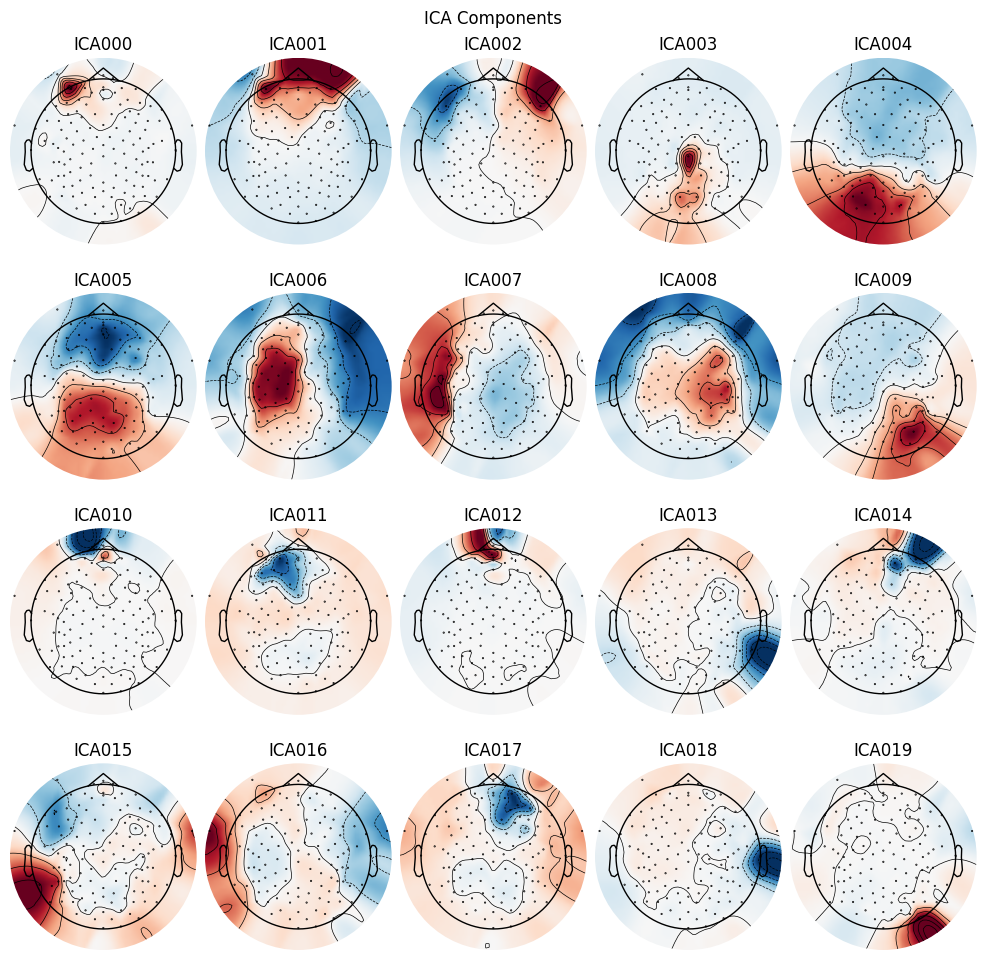

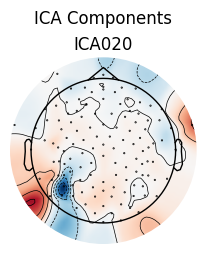

In [5]:
fig = ica.plot_components( title='ICA Components')
# Save the ICA plot

fig[0].savefig(f'report_images/sub-{subject}_eeg_ica_components.png', bbox_inches='tight')

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
67 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
67 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
67 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
67 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
67 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
67 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
67 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
67 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
67 matching events found
No baseline correction applied
0 projection i

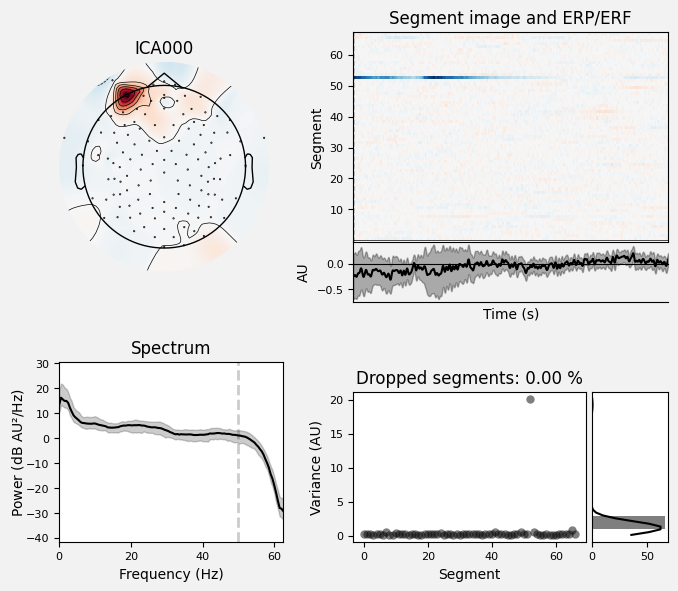

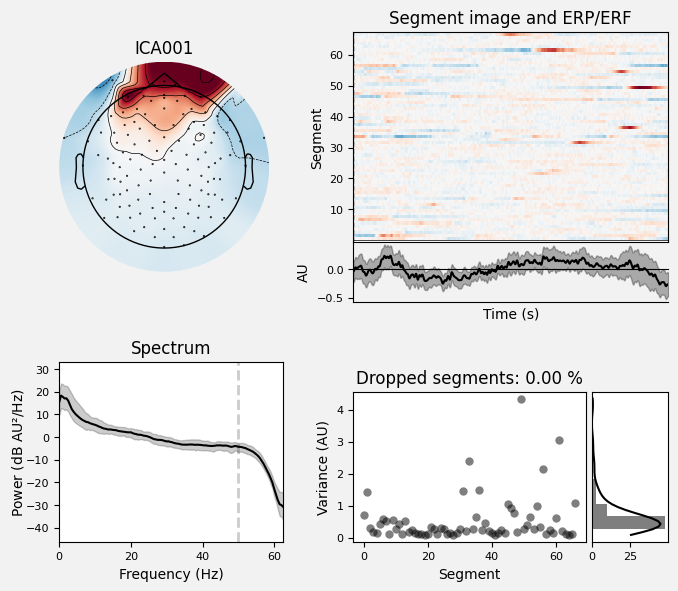

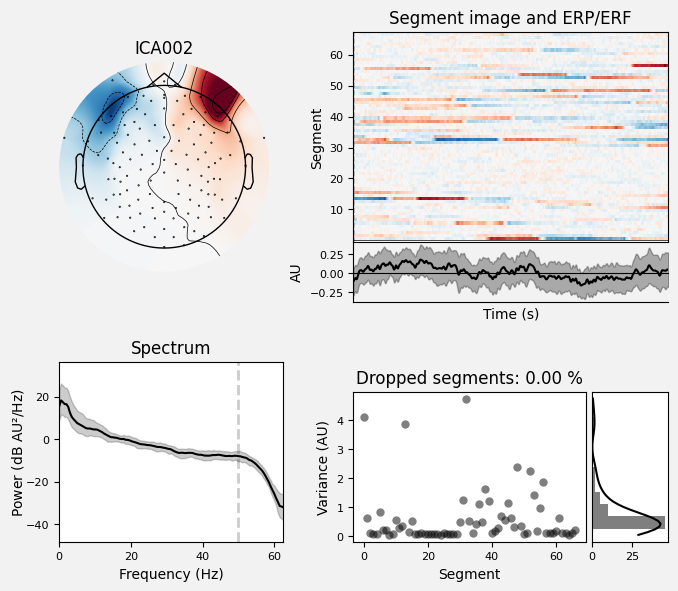

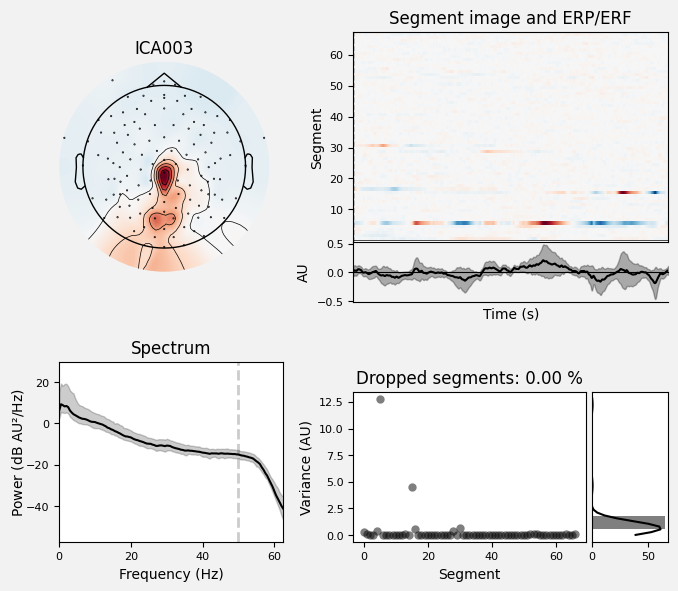

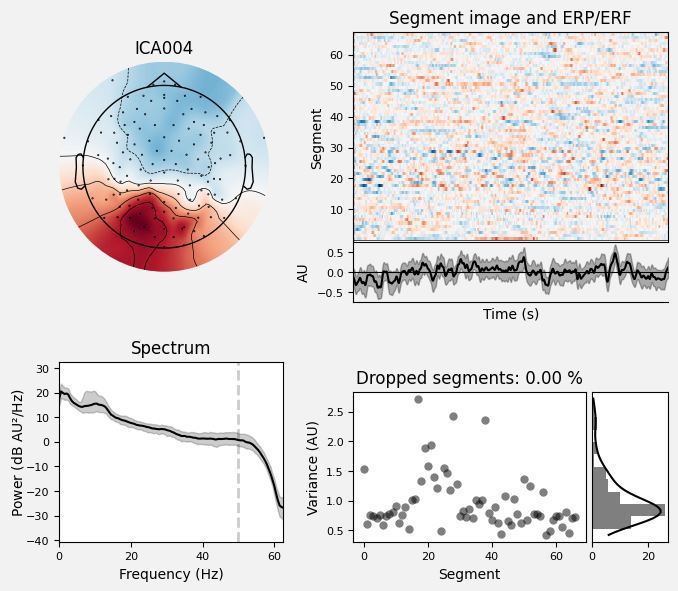

...

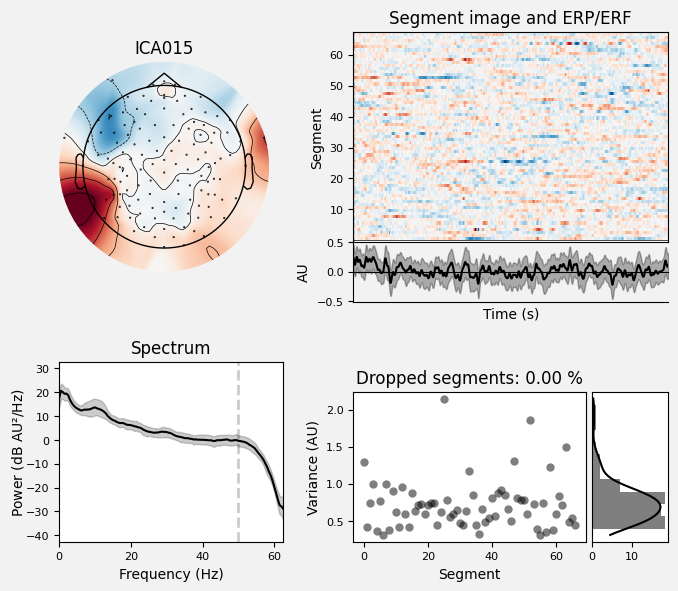

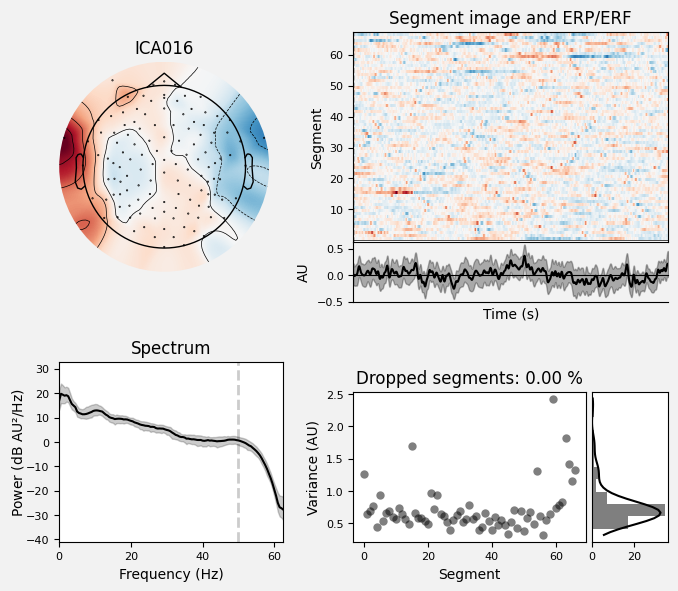

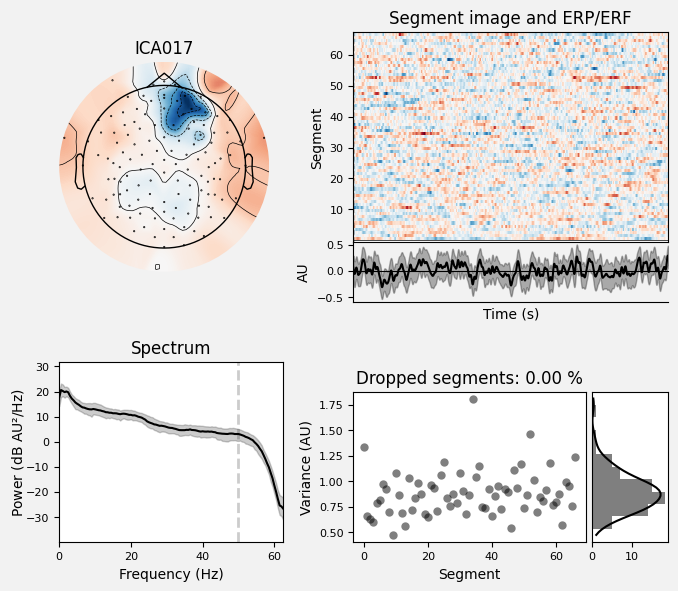

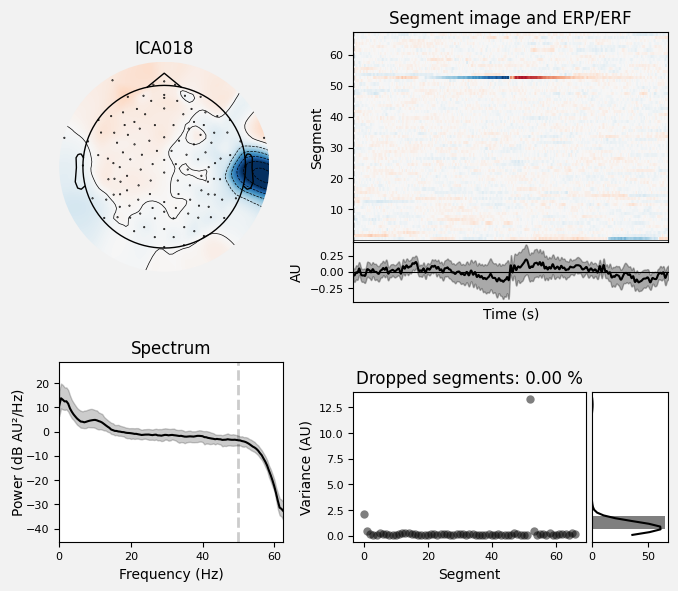

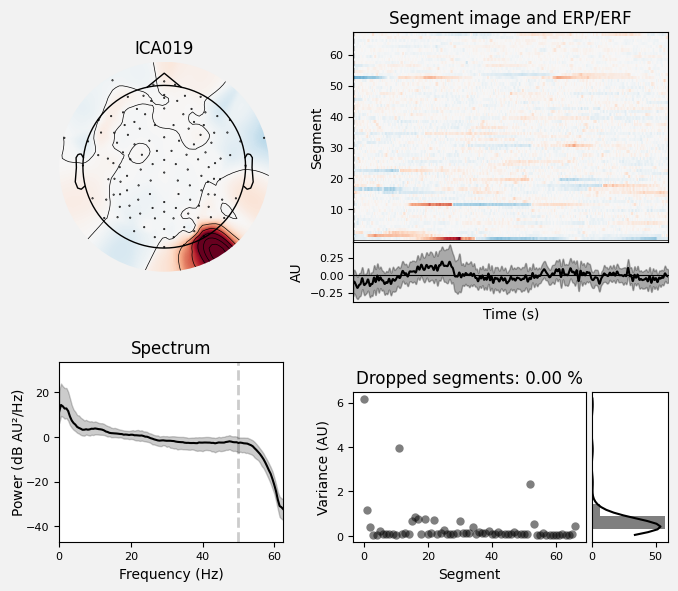

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [ ]:
ica.plot_properties(raw_cleaned, picks=range(ica.n_components_)) # This exact component number probably won't work if you recompute ICA


Applying ICA to Raw instance
    Transforming to ICA space (21 components)
    Zeroing out 0 ICA components
    Projecting back using 126 PCA components


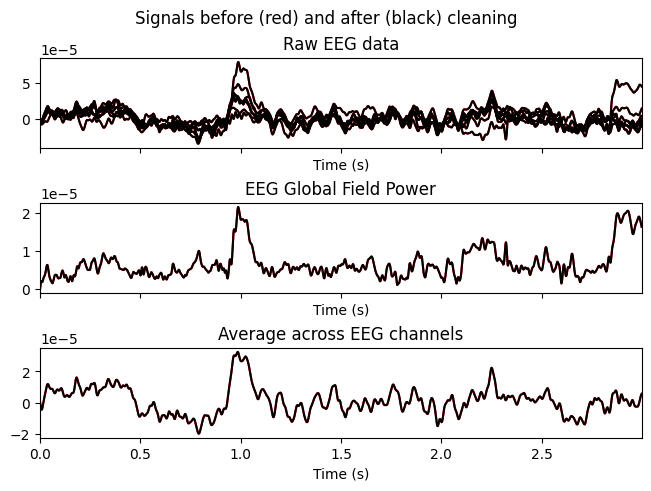

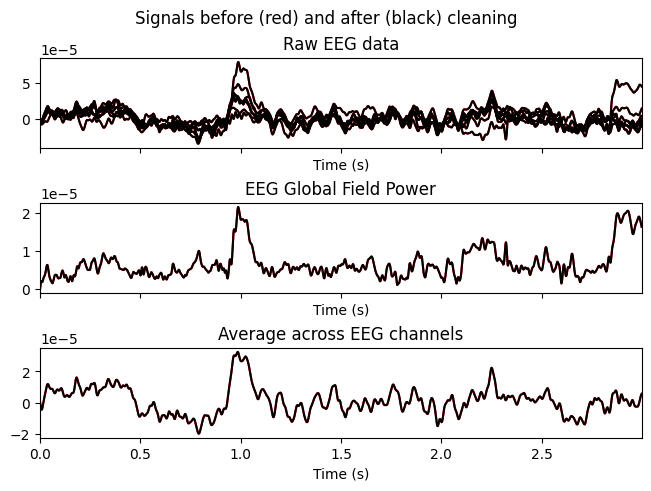

In [12]:
ica.plot_overlay(raw_cleaned, picks=[0,3,10,11,13,14,18,19])

In [13]:
ica.exclude = [0,3,10,11,13,14,18,19] # these are the components that we want to exclude
ica.apply(raw_cleaned)

Applying ICA to Raw instance
    Transforming to ICA space (21 components)
    Zeroing out 8 ICA components
    Projecting back using 126 PCA components


<Raw | sub-P5943825_ses-S001_task-CUNY_run-001_eeg_clean.fif, 129 x 299988 (300.0 s), ~295.4 MiB, data loaded>

In [14]:
eeg_vars['components_excluded'] = ica.exclude

### Generate figures

Using matplotlib as 2D backend.


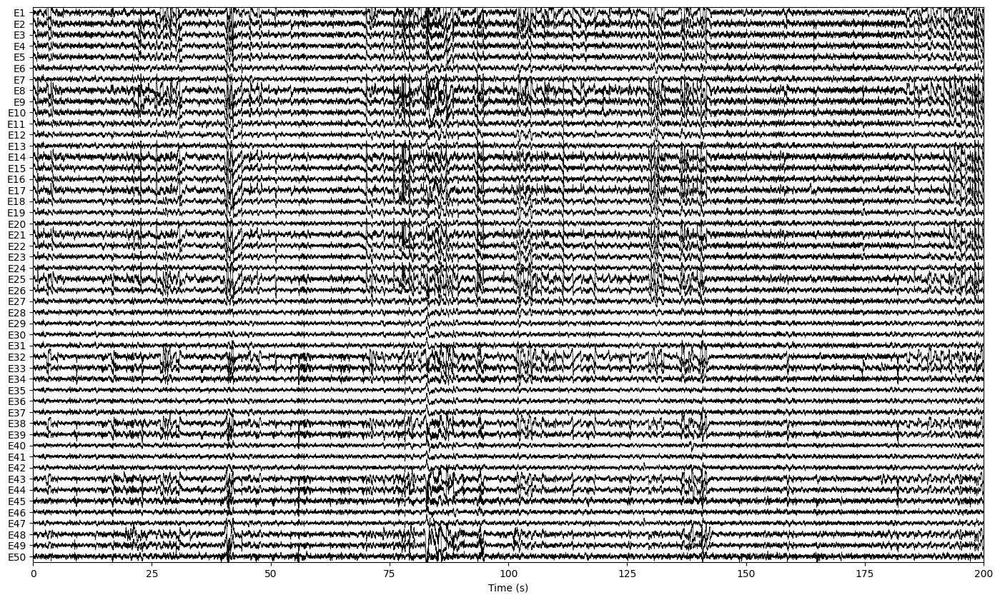

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 2.048 (s)
Plotting power spectral density (dB=True).


In [15]:
raw_cleaned.annotations.delete([i for i, desc in enumerate(raw_cleaned.annotations.description) if desc == 'blink' or desc == 'BAD_muscle'])
fig = raw_cleaned.plot(show_scrollbars=False,
                        show_scalebars=False,events=None, start=0, 
                        duration=200,n_channels=50, scalings=.35e-4, color='k', title='EEG Data after ICA')

fig.savefig(f'report_images/{subject}_eeg_cleaned.png', dpi=300, bbox_inches='tight')


fig = raw_cleaned.plot_psd(fmax=50, average=False, show=True)
fig.savefig(f'report_images/{subject}_eeg_cleaned_psd.png', dpi=300, bbox_inches='tight')

In [16]:
raw_cleaned_pathname = '/'.join(xdf_filename.split('/')[:-1]) + f'/sub-{subject}_ses-S001_task-CUNY_run-001_eeg_clean.fif'
raw_cleaned.save(raw_cleaned_pathname, overwrite=True)


eeg_print = {
    'Bad channels before robust reference': eeg_vars['bad_channels_before'], 
    'Interpolated channels': eeg_vars['interpolated_channels'], 
    'Bad channels after interpolation': eeg_vars['bad_channels_after'], 
    'Percent Good before artifact removal': f"{eeg_vars['percent_good']:.4}%",
    'Artifactual Components Excluded': ica.exclude
}

Overwriting existing file.
Writing /Users/bryan.gonzalez/CUNY_subs/sub-P5943825/sub-P5943825_ses-S001_task-CUNY_run-001_eeg_clean.fif
Closing /Users/bryan.gonzalez/CUNY_subs/sub-P5943825/sub-P5943825_ses-S001_task-CUNY_run-001_eeg_clean.fif
[done]


## 2. ECG

Effective sampling rate: 499.74573495706227
Average heart rate: 88.6239250796771
Kurtosis signal quality index: 17.135768921649717
Power spectrum distribution signal quality index: 0.6849904586234107
Relative power in baseline signal quality index: 23.578993416040007
Signal to Noise Ratio: 8.236143817401006


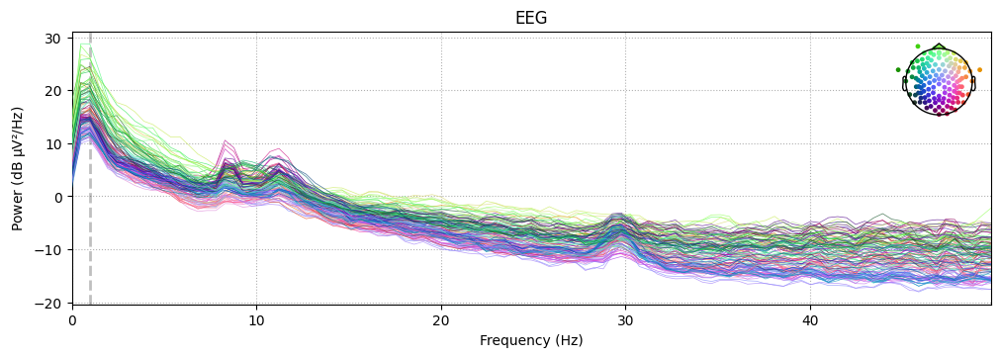

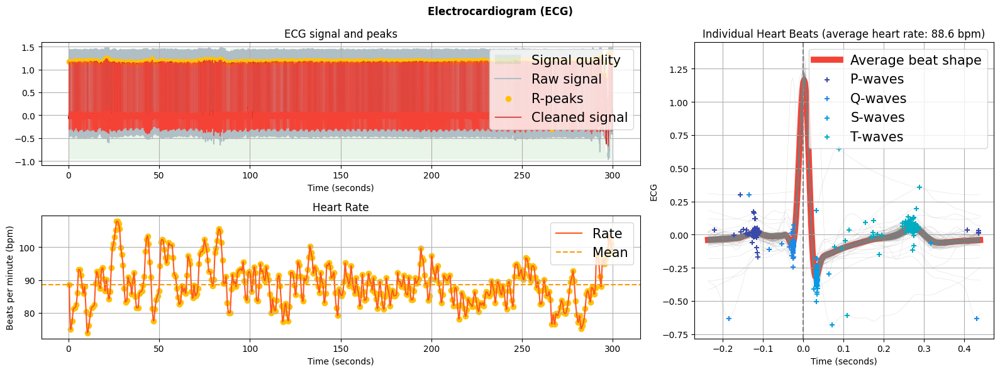

In [17]:
[ecg_vars, ecg_plt, ps_df] = ecg_qc(xdf_filename = xdf_filename, stim_df = stim_df, task='RestingState')


In [ ]:
ecg_vars.keys()

In [18]:
ecg_print = {
    "Effective sampling rate": f'{ecg_vars["sampling_rate"]:.4f} Hz', 
    "Signal to Noise Ratio": f'{ecg_vars["SNR"]:.4f} dB',
    "Average heart rate": f'{ecg_vars["average_heart_rate"]:.4f} bpm',
    "Kurtosis signal quality index (kSQI)": f'{ecg_vars["kurtosis_SQI"]:.4f}',
    "Power spectrum distribution (pSQI)": f'{ecg_vars["power_spectrum_distribution_SQI"]:.4f} mV²/Hz',
    "Relative power in baseline (basSQI)": f'{ecg_vars["relative_baseline_power_sqi"]:.4f}%'
}

In [19]:
ecg_print

{'Effective sampling rate': '499.7457 Hz',
 'Signal to Noise Ratio': '8.2361 dB',
 'Average heart rate': '88.6239 bpm',
 'Kurtosis signal quality index (kSQI)': '17.1358',
 'Power spectrum distribution (pSQI)': '0.6850 mV²/Hz',
 'Relative power in baseline (basSQI)': '23.5790%'}

## 3. EDA

Effective sampling rate: 499.746 Hz
Signal Integrity Check: 100.000 %
Average Skin Conductance Level: 5.708 mS
Skin Conductance Level Standard deviation: 0.935 mS
Skin Conductance Level Coefficient of Variation: 16.376 %
Average Amplitude of Skin Conductance Response: 0.104 mS
Skin Conductance Response Validity: 70.000 %
Signal to Noise Ratio: 50.268 dB


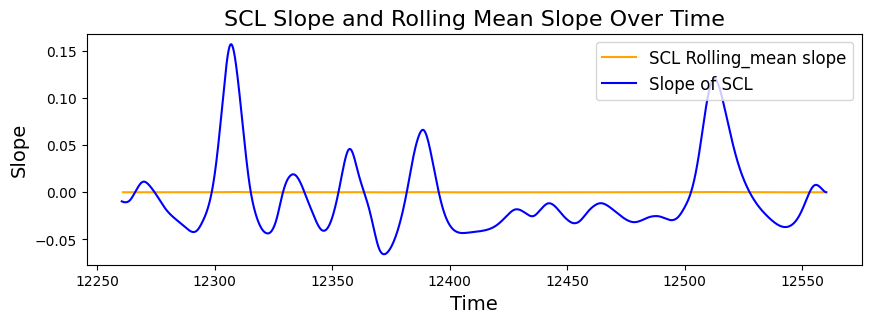

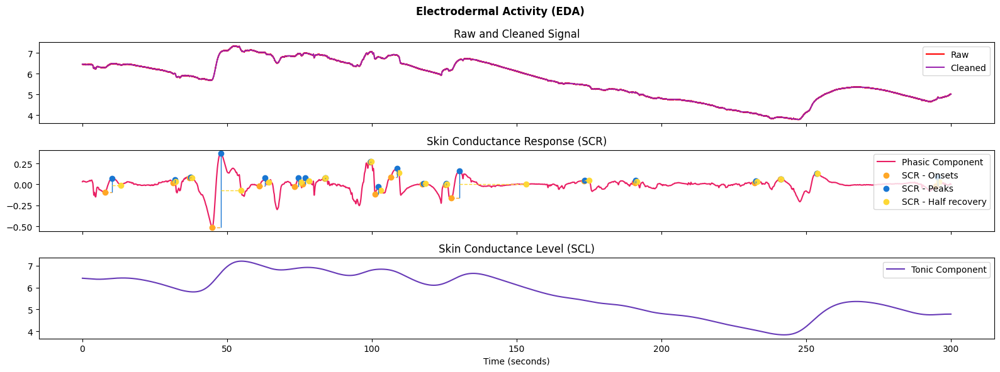

In [20]:
[eda_vars, eda_plt1, eda_plt2, ps_df] = eda_qc(xdf_filename = xdf_filename, stim_df = stim_df, task= 'RestingState')

In [ ]:
eda_vars.keys()

In [21]:
eda_print = {
    "Effective sampling rate": f'{eda_vars["sampling_rate"]:.4f} Hz', 
    "Signal to noise ratio": f'{eda_vars["snr"]:.4f} dB',
    "Signal integrity check": f'{eda_vars["signal_integrity_check"]:.4f}%',
    "Average skin conductance level": f'{eda_vars["average_scl"]:.4f} mS',
    "Skin conductance level std": f'{eda_vars["scl_sd"]:.4f} mS',
    "Skin conductance level coefficient of variation": f'{eda_vars["scl_cv"]:.4f}%',
    "Average amplitude of skin conductance response": f'{eda_vars["average_scr_amplitude"]:.4f} mS',
    "Skin conductance response validity": f'{eda_vars["sc_validity"]:.4f} %' # this will need to be changed to [scr_validity]
}

## 4. RSP

In [22]:
rsp_vars, ps_df = rsp_qc(xdf_filename=xdf_filename, stim_df=stim_df, task='RestingState')

Effective sampling rate: 499.7457
Signal to Noise Ratio: 8.9158
Breath amplitude mean: 0.2007
Breath amplitude std: 0.1252
Breath amplitude range: 0.0319 - 0.8181
Respiration rate mean: 19.5994
Respiration rate std: 2.5215
Respiration rate range: 13.5567 - 26.2503
Peak to peak interval mean: 2.7010
Peak to peak interval std: 1.0712
Peak to peak interval range: 0.5843 - 8.1922
Baseline drift: 0.0308
Autocorrelation at typical breath cycle: 0.0619


In [23]:
rsp_print = {
    "Effective sampling rate": f'{rsp_vars["sampling_rate"]:.4f} Hz', 
    "Signal to noise ratio": f'{rsp_vars["rsp_snr"]:.4f} dB',
    "Breath amplitude mean": f'{rsp_vars["breath_amplitude_mean"]:.4f} V',
    "Breath amplitude std": f'{rsp_vars["breath_amplitude_std"]:.4f} V',
    "Breath amplitude range": f'{rsp_vars["breath_amplitude_range"]} V',
    "Respiration rate mean": f'{rsp_vars["rsp_rate_mean"]:.4f} bpm',
    "Respiration rate std": f'{rsp_vars["rsp_rate_std"]:.4f} bpm', 
    "Respiration rate range": f'{rsp_vars["rsp_rate_range"]} bpm', 
    "Peak to peak interval mean": f'{rsp_vars["ptp_mean"]:.4f} sec', 
    "Peak to peak interval std": f'{rsp_vars["ptp_std"]:.4f} sec', 
    "Peak to peak interval range": f'{rsp_vars["ptp_range"]} sec', 
    "Baseline drift": f'{rsp_vars["baseline_drift"]:.4f} V', 
    "Autocorrelation at typical breath cycle": f'{rsp_vars["autocorrelation"]:.4f}'
}

In [24]:
rsp_print

{'Effective sampling rate': '499.7457 Hz',
 'Signal to noise ratio': '8.9158 dB',
 'Breath amplitude mean': '0.2007 V',
 'Breath amplitude std': '0.1252 V',
 'Breath amplitude range': '0.0319 - 0.8181 V',
 'Respiration rate mean': '19.5994 bpm',
 'Respiration rate std': '2.5215 bpm',
 'Respiration rate range': '13.5567 - 26.2503 bpm',
 'Peak to peak interval mean': '2.7010 sec',
 'Peak to peak interval std': '1.0712 sec',
 'Peak to peak interval range': '0.5843 - 8.1922 sec',
 'Baseline drift': '0.0308 V',
 'Autocorrelation at typical breath cycle': '0.0619'}

## 5. Mic

In [8]:
mic_vars, mic_df, mic_error = mic_qc(xdf_filename=xdf_filename, stim_df=stim_df)

2025-07-02 12:04:49,708 - pyxdf.pyxdf - WARNING - Stream 1: Calculated effective sampling rate 0.0000 Hz is different from specified rate 44100.0000 Hz.


Error: No mic data found for participant P5526515


In [10]:
if mic_error:
    vars['sampling_rate'], vars['lsl_wav_duration_diff'], vars['num_NaN'], vars['percent_NaN'], vars['quan25'], vars['quan75'], vars['std'], vars['min'], vars['max'] = float('nan')
    mic_print = f"No mic data was found for participant {subject}"
    log.append(mic_print)

else:
    mic_print = {
    "Effective sampling rate": f'{mic_vars["sampling_rate"]:.4f} Hz', 
    "Difference between .wav file and lsl timestamps durations": f'{mic_vars["lsl_wav_duration_diff"]:.4f} sec', 
    "Number of NaN's": f'{mic_vars["num_NaN"]}',
    "Percent of NaN's": f'{mic_vars["percent_NaN"]:.4f}%',
    "Mic samples first quartile": f'{mic_vars["quan25"]:.4f}',
    "Mic samples third quartile": f'{mic_vars["quan75"]:.4f}',
    "Mic samples std": f'{mic_vars["std"]:.4f}',
    "Mic samples min": f'{mic_vars["min"]:.4f}',
    "Mic samples max": f'{mic_vars["max"]:.4f}'
}

TypeError: cannot unpack non-iterable float object

## 6. Webcam

RestingState duration matches camera duration!
RestingState:  299.9976309217964
Webcam Stream:  299.97561612041136


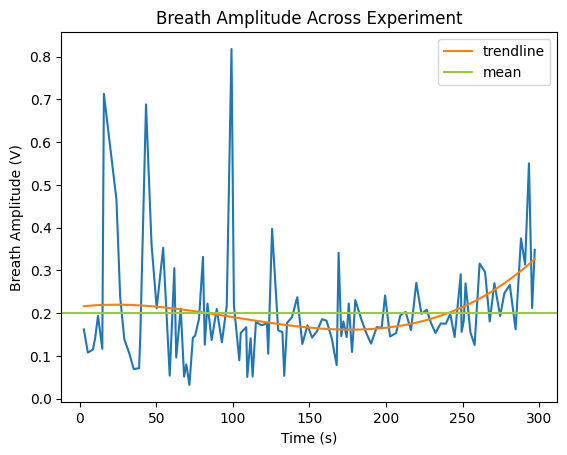

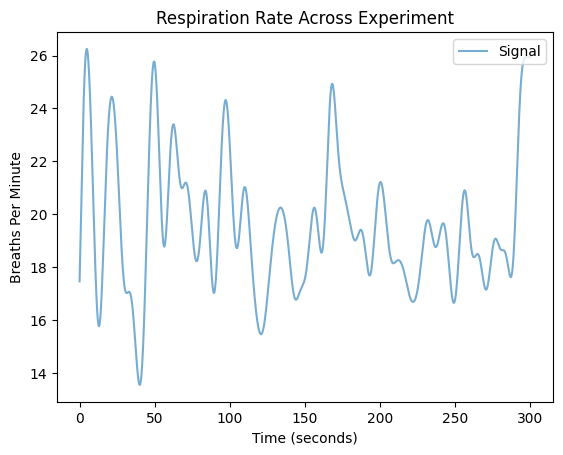

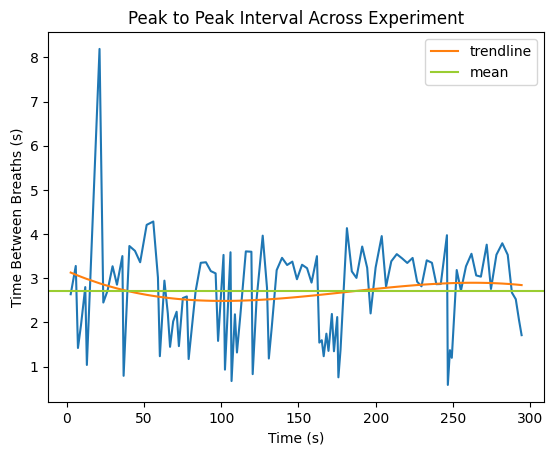

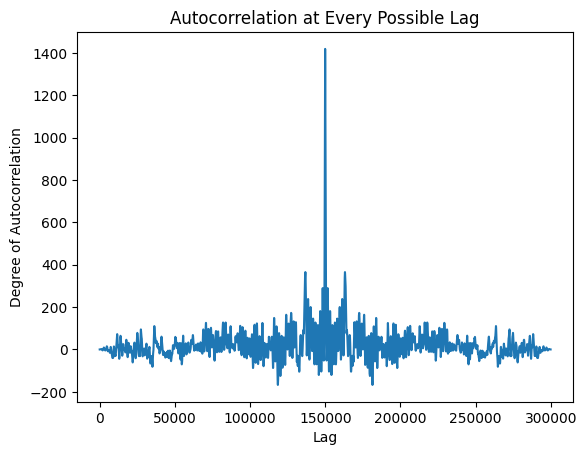

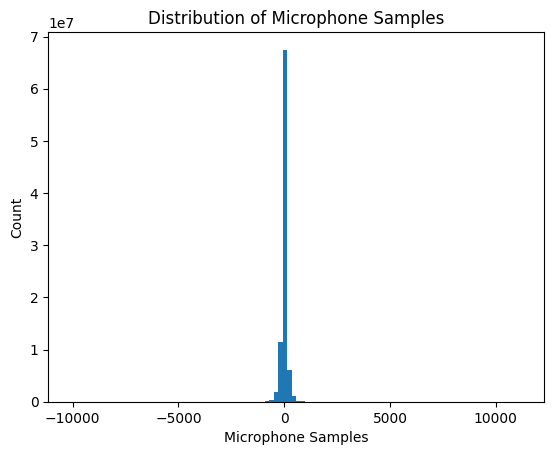

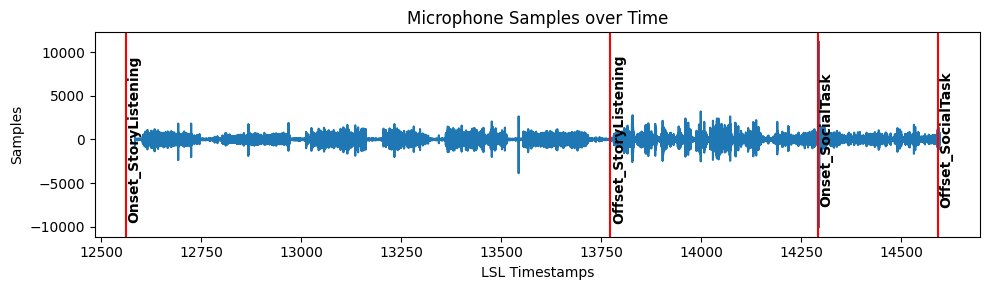

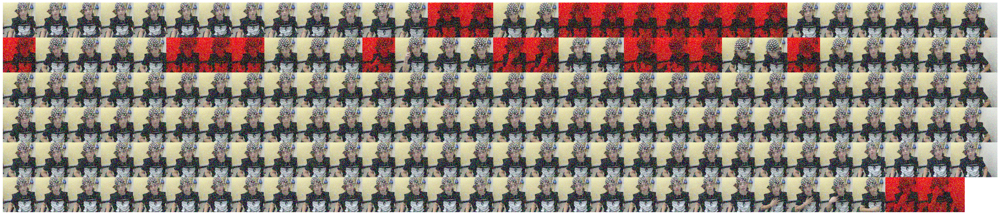

In [27]:
webcam_vars, cam_df = webcam_qc(xdf_filename=xdf_filename,
                                stim_df=stim_df,
                                video_file=video_filename, task='RestingState')

In [28]:
webcam_print = {
    "Effective sampling rate": f'{webcam_vars["sampling_rate"]:.4f} Hz', 
    "Collected full resting state": webcam_vars["collected_full_RestingState"], 
    "Percent of frames with face detected": f'{webcam_vars["face_perc"]:.4%}'
}

In [ ]:
webcam_print

## 7. ET

In [29]:
et_vars, et_df = et_qc(xdf_filename = xdf_filename, stim_df = stim_df, task='RestingState')

Effective sampling rate: 119.9960
Flag: all coordinates have the same % validity within each measure (LR, gaze point/origin/diameter): True
Flag: % of NaNs is the same between coordinate systems (UCS and TBCS (gaze origin) and between UCS and display area (gaze point)): True
Mean difference in percent valid data between right and left eyes: 11.1031%
Percent of data with gaze point differences of over 0.2 mm: 1.0938%


In [30]:
et_print = {
    "Effective sampling rate": f'{et_vars["sampling_rate"]:.4f} Hz', 
    "Flag: all coordinates have the same % validity within each measure (LR, gaze point/origin/diameter)": et_vars["flag1"], 
    "Flag: % of NaNs is the same between coordinate systems (UCS and TBCS (gaze origin) and between UCS and display area (gaze point))": et_vars["flag2"],
    "Mean difference in percent valid data between right and left eyes": f'{et_vars["LR_mean_diff"]:.4f}%',
    "Percent of data with gaze point differences of over 0.2 mm": f'{et_vars["percent_over02"]:.4f}%'
}

## Stream Durations 

### functions are in utils.py (but should be called in the report)

In [31]:
df_map = {
    'et': et_df,
    'ps': ps_df,
    'mic': mic_df,
    'cam': cam_df
    }
    # 'eeg': eeg_df

In [32]:
duration_vars = {"Durations of each modality + comparison to expected duration:": 
    get_durations(xdf_path=xdf_filename, task='Experiment', df_map = df_map, stim_df = stim_df)}

mic is shorter than expected for Experiment by 334.1896 seconds

Experiment DataFrame


In [33]:
duration_print = duration_vars

In [34]:
# i wont run these but they are here for reference
# get_durations('RestingState', xdf_filename)
# get_durations('CampFriend', xdf_filename)
# get_durations('SocialTask', xdf_filename)
# whole_durations(xdf_filename)

## LSL Problem

In [35]:
lsl_vars = lsl_problem_qc(xdf_filename, df_map=df_map, stim_df=stim_df, modality_to_plot='et')

no data loss detected for P5943825 for entire experiment
no data loss detected for P5943825 before social task


In [36]:
lsl_print = {
    "Percent of missing data in entire experiment": lsl_vars["percent_loss"],
    "Percent of missing data before social task offset": lsl_vars["loss_before_social_task"]
}

# Copy

In [ ]:
copy = {
    'EEG': 'Data preprocessed by performing <b>line noise removal</b>, <b>robust referencing</b>, and <b>bad channel detection/interpolation</b> using PyPrep pipeline. First, the pipeline applies a notch filter at 60 Hz and its harmonics to remove power line noise. Then, it performs <b>robust average referencing</b>, where it detects bad channels, interpolates them using surrounding signals, and computes a median-based reference across EEG channels. This ensures a stable reference even in the presence of noisy electrodes. Independent components analysis (ICA) was then performed to identify and remove ocular and muscle artifacts. The final output is a cleaned EEG dataset with a consistent reference, ready for further analysis.',
    'ET': 'In the eye tracking data, gaze origin, gaze point, and pupil diameter are reported, for the left and right eyes. Gaze origin describes the point in 3D space where the gaze vector starts, and is reported in both the user coordinate system (UCS) and the trackbox coordinate system (TBCS). Gaze point describes the spot on the screen where the participant is looking, for each eye. Gaze origin is reported in 3D space in the UCS and the display area. The percent of data for which the distance between the gaze point of the left and right eye is more than 0.2 mm is reported below.',
    'ECG': "The data was processed using the neurokit2 automated pipeline for preprocessing ECG signals. ECG data is cleaned using the default parameters that apply fifth order 0.5 Hz high-pass butterworth filter followed by 50 Hz powerline filtering. Neurokit2 was also used to calculate signal quality indices (SQI) based on Zhao et.al (2018). SQIs calculated were kurtosis (kSQI), power spectrum distribution of QRS wave (pSQI) and relative power in baseline (basSQI). kSQI was calculated using the Fisher's method. pSQI and basSQI were calculated using the Welch method.",
    'EDA': "Electrodermal Activity (EDA) is measured in microSiemens from a standard EDA sensor. EDA data quality metrics calculated from raw and clean data using neurokit2 python package. The data is processed using the neurokit2 automated pipeline for preprocessing EDA signal. EDA data is cleaned using the default parameters that apply fourth order butterworth filter. Additionally, the automated preprocessing pipeline was used to decompose the EDA signal into the tonic component, Skin Conductance Level (SCL) and the phasic component, Skin Conductance Response (SCR). The decomposition was done using default parameters that perform high-pass filtering with a cutoff frequency of 0.05Hz on EDA signal.",
    'RSP': "Respiration data is measured in volts from a piezoelectric sensor. Respiration data quality metrics are calculated both from raw and cleaned data, where the neurokit2 package was used to clean the data using the default method of a second order 0.05-3 Hz bandpass Butterworth filter, as in Khodadad et al, 2018. Neurokit2 was also used to extract the peaks and troughs of detected breaths. Respiration rate was calculated using the cross correlation method, which was more consistent to the raw data than the other trough method. Baseline drift was quantified as the standard deviation of the data after applying a lowpass filter to raw data.",
    'MIC': "For audio data, it is important to confirm that the distribution of microphone samples (see graph below) is relatively centered around 0, with no outlier peaks and no values above 32,000 or below -32,000.",
    'WEBCAM': "The quality of the webcam data is assessed by checking the percentage of frames where a face is detected. If a face is not detected in more than 50 percent of the frames, it may indicate issues with the recording or participant positioning.",
    'Stream Durations': "",
    'LSL': "While the difference between consecutive LSL time stamps are expected to consistently be equal to the inverse of the sampling rate, it was found that there were longer gaps between some LSL time stamps for some data modalities, indicating a potential system or other technical error during data collection. Below, the percentage of missing data for each data modality due to these LSL time stamp gaps is shown. The amount of data in seconds for each modality is also shown below, and each duration is then compared to the expected duration of the experiment."
}

# Second Report with formatting

In [41]:
# Modalities and corresponding data
metric_names = ["EEG", "ECG", "EDA", "RSP", "MIC","ET", "WEBCAM", "Stream Durations", "LSL"]
metrics_list = [eeg_print, ecg_print, eda_print, rsp_print, mic_print, et_print, webcam_print, duration_print, lsl_print]
# metric_names = ["ECG", "EDA","WEBCAM"]
# metrics_list = [ecg_print, eda_print,  webcam_print]

# PDF structure
parent_folder = xdf_filename.split('mobi')[0]
pdf_path = f"{parent_folder}QCReport.pdf"
doc = SimpleDocTemplate(pdf_path, pagesize=A4)
elements = []
styles = getSampleStyleSheet()

# Define subtitle style if not already done
subtitle_style = ParagraphStyle(
    name="Subtitle",
    parent=styles["Heading2"],
    fontSize=14,
    leading=16,
    textColor="gray",
    spaceAfter=12,
    alignment=1  # Centered
)

# page number function
def add_page_number(canvas, doc):
    page_num = f'{canvas.getPageNumber()}'
    canvas.setFont("Helvetica", 9)
    canvas.drawRightString(570, 20, page_num)  # (x, y) from bottom-left


elements.append(Paragraph(f"Subject Report: {subject}", styles["Title"]))
elements.append(Paragraph(f"Collection Date: {get_collection_date(xdf_filename)}", subtitle_style))
elements.append(Spacer(1, 12))

# Format each metrics dict
for name, metrics in zip(metric_names, metrics_list):
    elements.append(Paragraph(name, styles["Heading2"]))
    elements.append(Paragraph(copy[name], styles["Normal"]))
    elements.append(Spacer(1, 12))

    for k, v in metrics.items():
        if isinstance(v, pd.DataFrame):

            data = [v.columns.tolist()] + v.values.tolist()  # Include headers
            table = Table(data, repeatRows=1)
            table.hAlign = 'LEFT'

            table.setStyle(TableStyle([
                ('BACKGROUND', (0, 0), (-1, 0), colors.lightgrey),
                ('GRID', (0, 0), (-1, -1), 0.5, colors.black),
                ('FONTNAME', (0, 0), (-1, -1), 'Helvetica'),
                ('FONTSIZE', (0, 0), (-1, -1), 10),
                ('ALIGN', (0, 0), (-1, -1), 'LEFT'),
            ]))
            elements.append(Paragraph(k, styles['Normal']))
            elements.append(Spacer(1, 12))

            elements.append(table)
            elements.append(Spacer(1, 12))
        else:
            text = f"<b>{k}:</b> {v}" if isinstance(v, float) else f"<b>{k}:</b> {v}"
            elements.append(Paragraph(text, styles["Normal"]))
    elements.append(Spacer(1, 12))

    # images
    folder = "report_images"
    image_keyword = name.lower()
    if os.path.exists(folder):
        for fname in sorted(os.listdir(folder)):
            if image_keyword in fname.lower() and subject in fname:
                image_path = os.path.join(folder, fname)

                # get dimensions
                image_reader = ImageReader(image_path)
                orig_width, orig_height = image_reader.getSize()
                print(orig_width, orig_height)
                if orig_width > 4000:
                    img = Image(image_path, width=orig_width/9, height=orig_height/9)
                elif orig_width > 3000:
                    img = Image(image_path, width=orig_width/7, height=orig_height/7)
                elif orig_width > 2000:
                    img = Image(image_path, width = orig_width/5, height = orig_height/5)
                elif orig_width > 1400:
                    img = Image(image_path, width=orig_width/3, height=orig_height/3)
                else:
                    img = Image(image_path, width=orig_width/2, height=orig_height/2)  # Adjust size as needed
                elements.append(img)
                elements.append(Spacer(1, 12))



doc.build(elements, onFirstPage = add_page_number, onLaterPages = add_page_number)
print(f'PDF created: {pdf_path}')

4198 2520
3034 1084
986 960
1600 600
1600 600
871 323
640 480
640 480
640 480
640 480
640 480
1000 300
1000 300
4777 1008
640 480
PDF created: /Users/bryan.gonzalez/CUNY_subs/sub-P5943825/sub-P5943825_ses-S001_task-CUNY_run-001_QCReport.pdf


In [ ]:
#from IPython.display import FileLink

#FileLink(pdf_path)